In [1]:
import numpy as np
import matplotlib.pyplot as plt
from linreg.linreg import LinearRegression
from copy import deepcopy
from IPython.display import HTML

%load_ext autoreload
%autoreload 2
%matplotlib widget

In [2]:
# building X and y
seed_value = 42
rng = np.random.default_rng(seed_value)

feat_len = 8
set_len = 34

X = rng.random((set_len, feat_len))
X_w_ones = np.c_[X, np.ones(set_len)]

actual_w = (rng.random(size=(1, feat_len + 1)) * 2) - 1

noise = (rng.random(size=(set_len, 1)) - 0.5) / 10

y = X_w_ones @ actual_w.T + noise
y = y.reshape(set_len, 1)

In [3]:
linreg = LinearRegression(feat_len, seed=42)

In [4]:
linreg.calculate_mse(X, y)

np.float64(2.051137065154559)

In [5]:
y_pred = linreg.predict(X)
y_pred

array([[ 2.2165709 ],
       [ 0.52478145],
       [ 1.13510243],
       [ 1.47797334],
       [ 0.64981086],
       [ 0.47684931],
       [ 0.56807366],
       [ 0.2221296 ],
       [ 0.79358298],
       [ 0.97887409],
       [ 0.92900695],
       [ 0.18584115],
       [ 0.5295826 ],
       [ 1.15920409],
       [ 0.47128739],
       [ 0.41261596],
       [-0.09141341],
       [ 1.20520404],
       [ 0.5349424 ],
       [ 0.82704155],
       [ 0.18146063],
       [ 0.51978234],
       [ 0.88694085],
       [ 0.17429412],
       [ 0.02816367],
       [ 0.64301242],
       [ 1.38760376],
       [ 1.24852892],
       [-0.56363584],
       [ 1.13836013],
       [ 0.87423533],
       [ 0.63695092],
       [ 0.88335706],
       [ 0.06066905]])

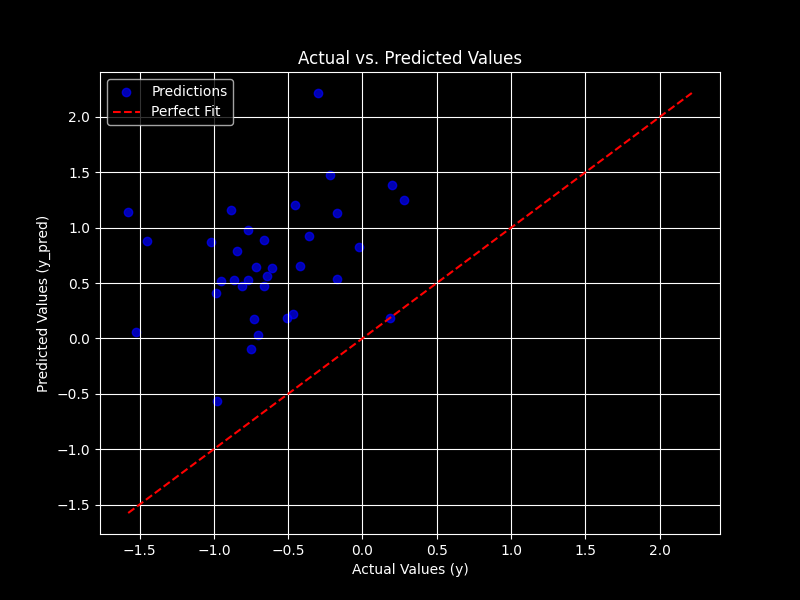

In [6]:
plt.figure(figsize=(8, 6))
plt.scatter(y, y_pred, color='blue', alpha=0.7, label='Predictions')

max_val = max(y.max(), y_pred.max())
min_val = min(y.min(), y_pred.min())
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='Perfect Fit')

plt.xlabel('Actual Values (y)')
plt.ylabel('Predicted Values (y_pred)')
plt.title('Actual vs. Predicted Values')
plt.legend()
plt.grid(True)

plt.show()

In [7]:
grad = linreg.mse_gradient(X, y)
grad

array([[1.55808638, 1.29694886, 1.21346125, 1.22985452, 1.00931528,
        1.61607825, 1.23131794, 1.30326391, 2.6259122 ]])

In [8]:
LR = 0.3
update_vec = -grad * LR
update_vec


array([[-0.46742591, -0.38908466, -0.36403838, -0.36895636, -0.30279458,
        -0.48482347, -0.36939538, -0.39097917, -0.78777366]])

In [9]:
update_vec.shape

(1, 9)

In [10]:
# update the weights
linreg.weights = linreg.weights + update_vec

In [11]:
y_pred = linreg.predict(X)

In [12]:
linreg.calculate_mse(X, y)

np.float64(1.3096998492629313)

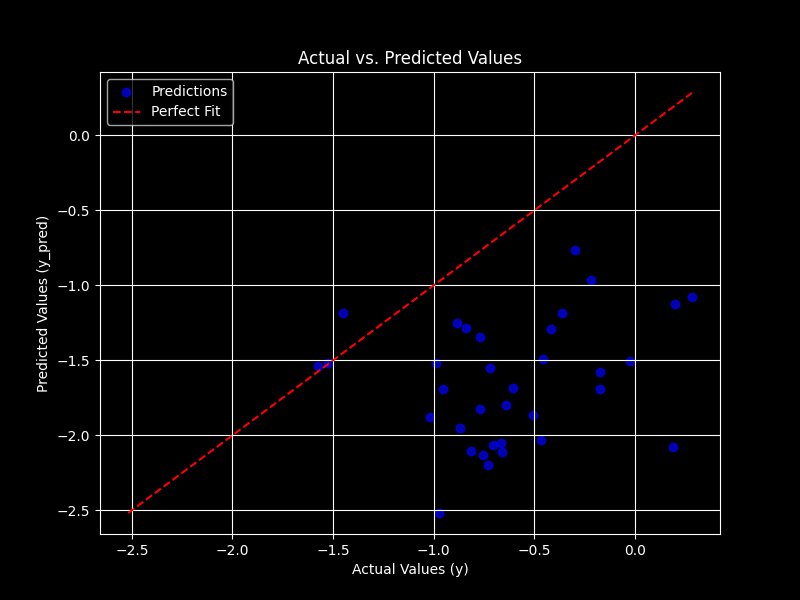

In [13]:
plt.figure(figsize=(8, 6))
plt.scatter(y, y_pred, color='blue', alpha=0.7, label='Predictions')

max_val = max(y.max(), y_pred.max())
min_val = min(y.min(), y_pred.min())
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='Perfect Fit')

plt.xlabel('Actual Values (y)')
plt.ylabel('Predicted Values (y_pred)')
plt.title('Actual vs. Predicted Values')
plt.legend()
plt.grid(True)

plt.show()

In [14]:
for i in range(25): # learning process pretty much
    grad = linreg.mse_gradient(X, y)
    update_vec = -grad * LR
    linreg.weights = linreg.weights + update_vec
    y_pred = linreg.predict(X)
    print(linreg.calculate_mse(X, y))

0.8573230634820931
0.5787030431312568
0.40485164865277035
0.2944511360210475
0.2227203616976338
0.17476558580571608
0.14160888125443008
0.11781534149746682
0.10007500678637471
0.08635496315154932
0.07539201324264877
0.06638882329682251
0.05883167900383149
0.05238095716544922
0.04680510804413784
0.04194069919362927
0.03766809172956494
0.033896512684915725
0.030554791555064093
0.02758552553084194
0.02494133232440876
0.022582384364865732
0.020474738242047368
0.018589165049932778
0.016900302346869643


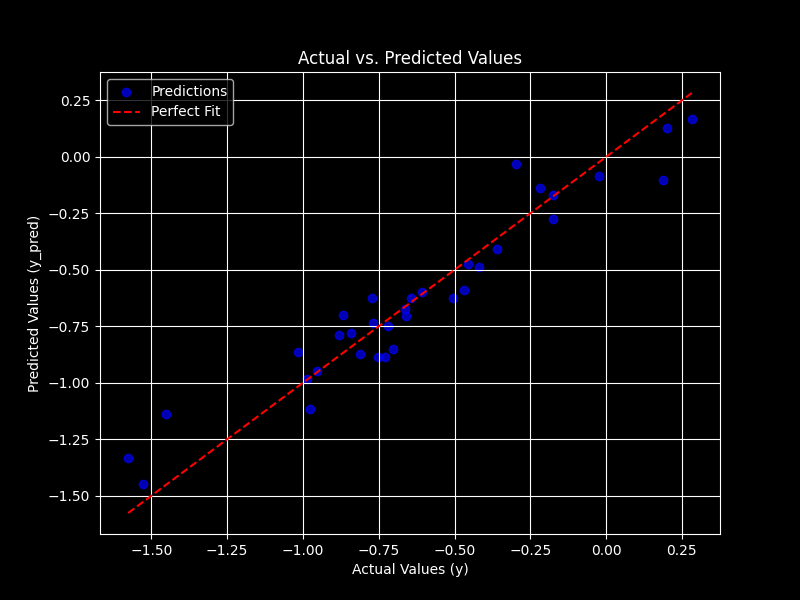

In [15]:
plt.figure(figsize=(8, 6))
plt.scatter(y, y_pred, color='blue', alpha=0.7, label='Predictions')

max_val = max(y.max(), y_pred.max())
min_val = min(y.min(), y_pred.min())
plt.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='Perfect Fit')

plt.xlabel('Actual Values (y)')
plt.ylabel('Predicted Values (y_pred)')
plt.title('Actual vs. Predicted Values')
plt.legend()
plt.grid(True)

plt.show()

## The Core Definitions

Imagine you have a textbook with **1,000 practice questions** (your dataset).

### 1. Batch Size

The **Batch Size** is how many exam questions you look at *before* you check the answer key and update your mental strategy (the model updating its weights).

* If your batch size is 10, you solve 10 questions, look at the answers, realize you are weak on geometry, adjust your strategy, and move on to the next 10 questions.

### 2. Iteration (or Step)

An **Iteration** is a single weight update. Every time the model processes *one batch*, it completes *one iteration*.

* If you have 1,000 questions and your batch size is 10, you will need to do **100 iterations** to get through the whole book.

### 3. Epoch

An **Epoch** is completed when the model has looked at **the entire dataset exactly once**.

* Going through all 1,000 questions in the textbook once equals **1 Epoch**. If you loop through the textbook 20 times to memorize it better, your model is training for **20 Epochs**.

---

## Connecting the Dots: The 3 Flavors of Gradient Descent

The only thing that fundamentally changes between Batch, Stochastic, and Mini-Batch Gradient Descent is **the Batch Size**. Everything else is just math reacting to that single number.

### 1. Batch Gradient Descent (BGD)

* **The Concept:** You read all 1,000 questions in the textbook, average out your mistakes across the entire book, and then make *one single adjustment* to your strategy.
* **Batch Size:** $n$ (The total number of samples in your dataset).
* **Math Behavior:** 1 Epoch = 1 Iteration. If you train for 50 epochs, the model only updates its weights 50 times total.
* **The Reality:** It's incredibly stable because it sees the "big picture" before every step. But if your textbook has 1,000,000,000 questions, your memory (RAM) will melt before you finish the first step.

### 2. Stochastic Gradient Descent (SGD)

* **The Concept:** You look at Question #1, check the answer, instantly change your strategy. Look at Question #2, check the answer, instantly change your strategy again.
* **Batch Size:** $1$.
* **Math Behavior:** 1 Epoch = $n\_samples$ Iterations. If you have 1,000 samples, the model updates its weights 1,000 times in just one epoch.
* **The Reality:** It's incredibly fast to start learning and uses almost zero memory. However, because individual data points can be noisy or outright wrong (outliers), the model's strategy updates wildly back and forth. It never perfectly settles down; it just "hover-wavers" around the best solution.

### 3. Mini-Batch Gradient Descent

* **The Concept:** The goldilocks zone. You read a small group of questions (e.g., 32 or 64), average out your mistakes for that group, adjust your strategy, and move to the next group.
* **Batch Size:** Typically a power of 2 between $32$ and $512$ (chosen because computer hardware/GPUs process powers of 2 incredibly fast).
* **Math Behavior:** 1 Epoch = $n\_samples / \text{batch\_size}$ Iterations.
* **The Reality:** This is what practically every modern AI system uses. It's computationally efficient because matrix math loves handling small matrices, and the updates are smooth enough to converge cleanly without the wild chaos of SGD.

---

## Summary Formula Checklist

To tie it all together mathematically:

$$\text{Iterations per Epoch} = \frac{\text{Total Number of Samples } (n)}{\text{Batch Size}}$$

$$\text{Total Updates to Weights} = \text{Iterations per Epoch} \times \text{Epochs}$$

So far what we have done up to this point was BGD, let's now try to use different strategies and compare.

In [16]:
# let's instantiate new models
linreg_bgd = LinearRegression(feat_len, seed=42)
linreg_sgd = deepcopy(linreg_bgd)
linreg_mbd = deepcopy(linreg_bgd)

LR = 0.3

bgd_history = list(linreg_bgd.fit_generator(X, y, LR, batch_size=set_len, epochs=50))
sgd_history = list(linreg_sgd.fit_generator(X, y, LR, batch_size=1, epochs=50))
mbd_history = list(linreg_mbd.fit_generator(X, y, LR, batch_size=8, epochs=50))

max_len = 300

bgd_history = bgd_history[:max_len]
sgd_history = sgd_history[:max_len]
mbd_history = mbd_history[:max_len]

# pad shorter ones to max_len so they freeze at final state
bgd_history += [bgd_history[-1]] * (max_len - len(bgd_history))
sgd_history += [sgd_history[-1]] * (max_len - len(sgd_history))
mbd_history += [mbd_history[-1]] * (max_len - len(mbd_history))

In [17]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np

def predicts_for_weights(weights, X):
    X_w_ones = np.c_[X, np.ones(X.shape[0])]
    return (X_w_ones @ weights.T)

fig, axes = plt.subplots(1, 3, figsize=(8, 3))
titles = ["BGD", "SGD", "Mini-batch GD"]
histories = [bgd_history, sgd_history, mbd_history]

# diagonal perfect-fit line bounds
min_val, max_val = y.min(), y.max()

scatters = []
diag_lines = []

for ax, title in zip(axes, titles):
    sc = ax.scatter([], [], color='blue', alpha=0.7, label='Predictions')
    dl, = ax.plot([min_val, max_val], [min_val, max_val],
                  color='red', linestyle='--', label='Perfect Fit')
    ax.set_xlim(min_val, max_val)
    ax.set_ylim(min_val, max_val)
    ax.set_title(title)
    ax.grid(True)
    scatters.append(sc)
    diag_lines.append(dl)

def update(frame):
    for sc, hist, ax, title in zip(scatters, histories, axes, titles):
        weights = hist[frame]
        y_pred = predicts_for_weights(weights, X)
        sc.set_offsets(np.c_[y.flatten(), y_pred])  # x=actual, y=predicted
        ax.set_title(f"{title} — step {frame}")
    return scatters

ani = animation.FuncAnimation(fig, update, frames=max_len, interval=50, blit=False)
plt.tight_layout()
plt.close(fig)
HTML(ani.to_jshtml())

 Now let's instantiate new data and try out some regularization, we will go through 3 regularization techniques:
- ridge (L2)
- lasso (L1)
- elastic net (L1+L2)

In [18]:
feat_len = 6
set_len = 20 # decrease the data set entries

X = rng.random((set_len, feat_len))
X_w_ones = np.c_[X, np.ones(set_len)]

actual_w = (rng.random(size=(1, feat_len + 1)) * 2) - 1

noise = (rng.random(size=(set_len, 1)) - 0.5) / 3 # increase the noise

y = X_w_ones @ actual_w.T + noise
y = y.reshape(set_len, 1)

# now we will actually do some splits to check if test acc get bigger
X_train = X[:13]
y_train = y[:13]
X_test = X[13:]
y_test = y[13:]

In [19]:
linreg_ols = LinearRegression(feat_len, seed=42)
linreg_ridge = deepcopy(linreg_ols)
linreg_lasso = deepcopy(linreg_ols)
linreg_elnet = deepcopy(linreg_ols)

linreg_ridge.l2_coeff = 0.05
linreg_lasso.l1_coeff = 0.05
linreg_elnet.l2_coeff = 0.025
linreg_elnet.l1_coeff = 0.025

LR = 0.3

ridge_history = list(linreg_ridge.fit_generator(X_train, y_train, LR, batch_size=12, epochs=25))
lasso_history = list(linreg_lasso.fit_generator(X_train, y_train, LR, batch_size=12, epochs=25))
elnet_history = list(linreg_elnet.fit_generator(X_train, y_train, LR, batch_size=12, epochs=25))
ols_history = list(linreg_ols.fit_generator(X_train, y_train, LR, batch_size=12, epochs=25))

In [20]:
fig, axes = plt.subplots(2, 2, figsize=(6, 6))
titles = ["Ridge", "Lasso", "Elnet", "OLS"]
histories = [ridge_history, lasso_history, elnet_history, ols_history]

min_val, max_val = y.min(), y.max()

scatters = []
diag_lines = []

for ax, title in zip(axes.flatten(), titles):
    sc = ax.scatter([], [], color='blue', alpha=0.7, label='Predictions')
    dl, = ax.plot([min_val, max_val], [min_val, max_val],
                  color='red', linestyle='--', label='Perfect Fit')
    ax.set_xlim(min_val, max_val)
    ax.set_ylim(min_val, max_val)
    ax.set_title(title)
    ax.grid(True)
    scatters.append(sc)
    diag_lines.append(dl)

def update(frame):
    for sc, hist, ax, title in zip(scatters, histories, axes.flatten(), titles):
        weights = hist[frame]
        y_pred = predicts_for_weights(weights, X)
        sc.set_offsets(np.c_[y.flatten(), y_pred])  # x=actual, y=predicted
        ax.set_title(f"{title} — step {frame}")
    return scatters

ani2 = animation.FuncAnimation(fig, update, frames=len(ridge_history), interval=150, blit=False)
plt.tight_layout()
plt.close(fig)
HTML(ani2.to_jshtml())

In [21]:
# check the accuracy
models = [linreg_ridge, linreg_lasso, linreg_elnet, linreg_ols]

print("Train accuracy:")
for model, title in zip(models, titles):
    print(f"{title} train accuracy: {model.calculate_mse(X_train, y_train)}")

print("Test accuracy:")
for model, title in zip(models, titles):
    print(f"{title} test accuracy: {model.calculate_mse(X_test, y_test)}")

print("Weights:")
for model, title in zip(models, titles):
    print(f"{title} weights:\n {model.weights}")

print(f"Actual weights:\n {actual_w}")


Train accuracy:
Ridge train accuracy: 0.05238738319570942
Lasso train accuracy: 0.0946880447433515
Elnet train accuracy: 0.07025317899980019
OLS train accuracy: 0.03963229454363341
Test accuracy:
Ridge test accuracy: 0.09111923567846245
Lasso test accuracy: 0.11966092765224953
Elnet test accuracy: 0.10133953173155995
OLS test accuracy: 0.03764365105847538
Weights:
Ridge weights:
 [[-0.4208676  -0.25373925  0.03245251  0.01782684  0.15851146  0.28995886
  -0.58417916]]
Lasso weights:
 [[-0.37765553 -0.12954239 -0.01425763 -0.03178852  0.02015289  0.18795517
  -0.56409565]]
Elnet weights:
 [[-0.40159787 -0.19548829 -0.00646074 -0.00288644  0.09220576  0.2500327
  -0.57069833]]
OLS weights:
 [[-0.7251467  -0.41353104  0.03990652 -0.05678019  0.08269414  0.62643285
  -0.44656588]]
Actual weights:
 [[-0.59643578 -0.75015264  0.00906198  0.49037626  0.26002369  0.7022622
  -0.68957402]]


It seems our data is too good to benefit from regularization, in principle regularization should shine with messy data sets when we have many features and not a lot of n_samples. I specifically increased the noise and decreased the n_samples but it seems it's still ok for OLS to take #1 place.